In [1]:
# Import packages
import glob
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn import plotting
import scipy.ndimage as ndi
import numpy as np
import matplotlib.patches as patches
import cv2
import os

In [2]:
path = '/home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/*'  
# Path de los pacientes
pat_list = glob.glob(path)

z_list = []  # Lista dimensiones z
empty_pat = [] # Lista vacía
total_list = 0
for pat in pat_list: 
    n = pat.split("/")
    pat_img_list = glob.glob(pat + '/*.nii.gz')  # Lista de imágenes del paciente
    
    if len(pat_img_list) == 0:
        empty_pat.append(n[4]) # Añades nombre paciente
    else:
        try:
            full_img =  glob.glob(pat + '/image.nii.gz')
            full_img_vol = nib.load(full_img[0]) # Selecciona la imagen no segmentada
            x, y, z = full_img_vol.shape
            z_list.append(z) # Añades dimensiones z
            total_list += 1
        
        except IndexError:
            print(n[4] + ' IndexError')
            pass
    
# Imprimes
print('Total de pacientes = ', total_list)
print('Total de pacientes vacíos = ', len(empty_pat))
print('Rango de Z:', min(z_list),',', max(z_list))


Total de pacientes =  111
Total de pacientes vacíos =  0
Rango de Z: 145 , 983


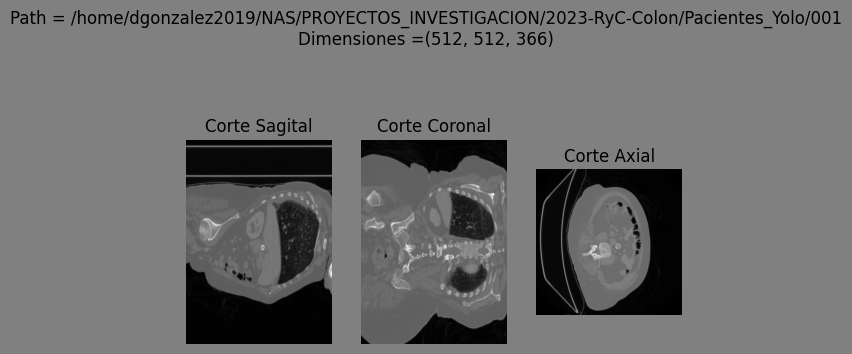

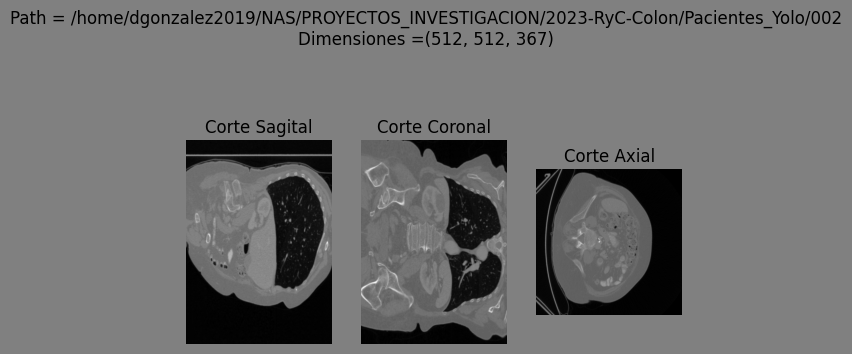

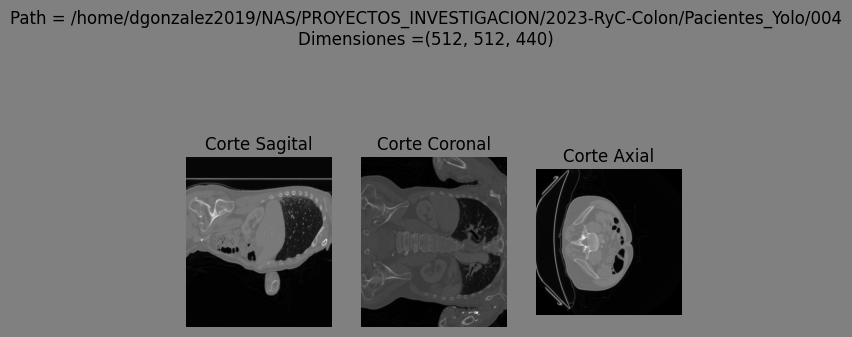

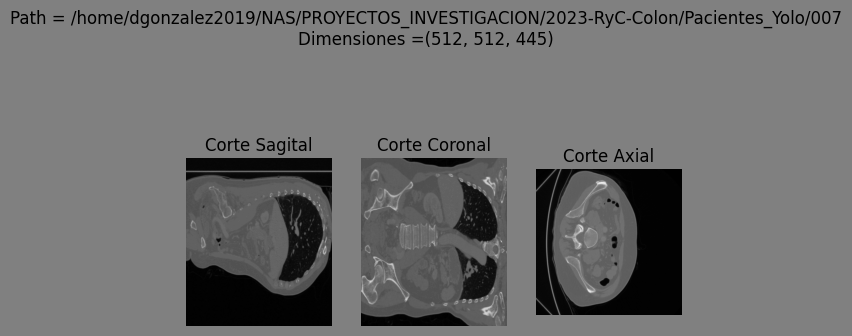

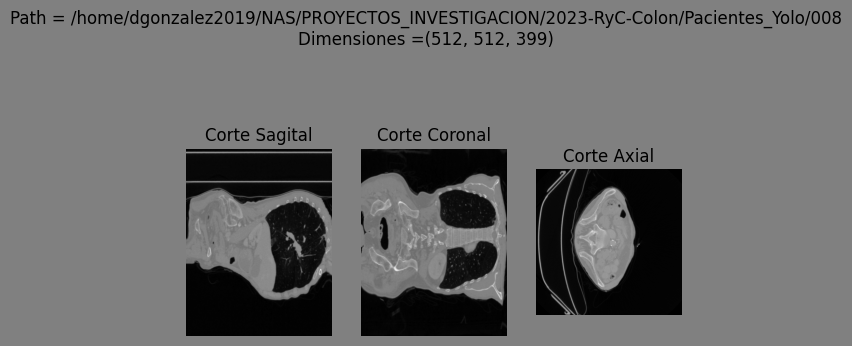

...

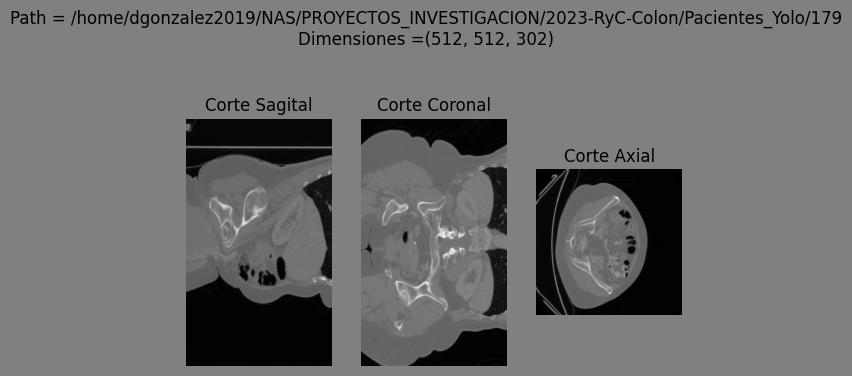

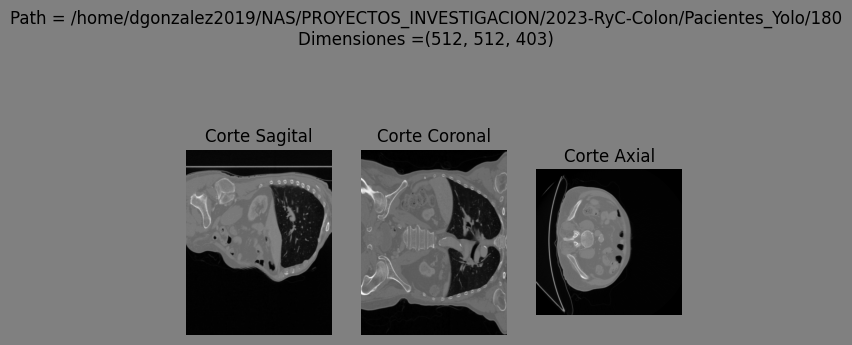

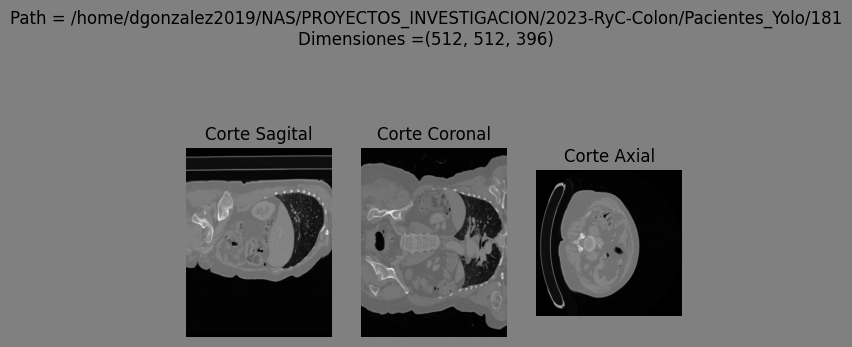

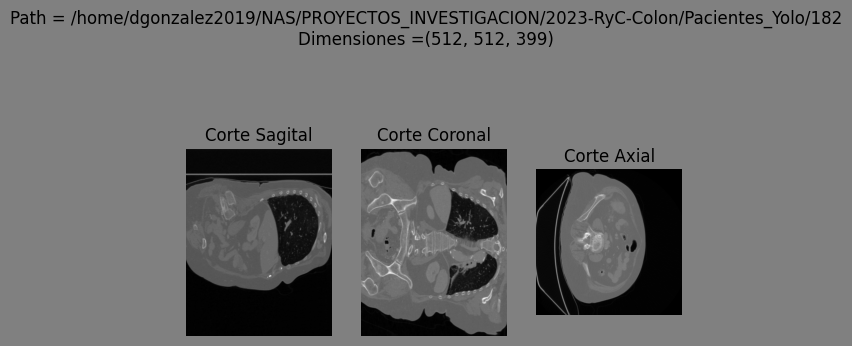

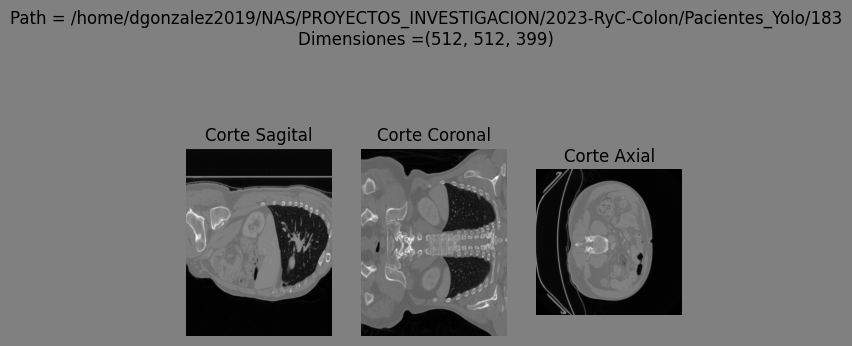

In [3]:
path = '/home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/*'  # Path de los pacientes
pat_list = glob.glob(path)

for pat in pat_list:
    
    pat_img_list = glob.glob(pat + '/*.nii.gz')  # Lista de imágenes del paciente

    full_img = glob.glob(pat + '/image.nii.gz') # Selección de la full img 
    img_vol = nib.load(full_img[0]) 
    img_vol_data = img_vol.get_fdata() # Extraemos intensidades
        
    fig, subs = plt.subplots(1,3) # Especifica subplots
    
    # Corte sagital
    subs[0].imshow(img_vol_data[188,:,:], cmap='gray')
    subs[0].axis('off')
    subs[0].title.set_text('Corte Sagital')

    # Corte coronal
    subs[1].imshow(img_vol_data[:,188,:], cmap='gray')
    subs[1].axis('off')
    subs[1].title.set_text('Corte Coronal')
    
    # Corte axial
    subs[2].imshow(img_vol_data[:,:,140], cmap='gray')
    subs[2].axis('off')
    subs[2].title.set_text('Corte Axial')
    
    # Información del path y las dimesniones
    tittle = 'Path = ' + str(pat) + '\n' + 'Dimensiones =' + str(img_vol_data.shape)
    
    # Plotear
    plt.suptitle(str(tittle), fontsize=12)
    fig.set_facecolor('gray')
    plt.show(block=False)

In [4]:
path = '/home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/*'
pat_list = glob.glob(path)

for pat in pat_list:
    pat_img_list = glob.glob(pat + '/*.nii.gz')  # Lista de imágenes del paciente

    print('Path = ',pat)

    full_img = glob.glob(pat + '/image.nii.gz') # Selección de la full img 
    img_vol = nib.load(full_img[0]) 
    img_vol_data = img_vol.get_fdata() # Extraemos intensidades
    print('Dimensiones full image = ',img_vol_data.shape)

    node_img = glob.glob(pat + '/node_segmentation.nii.gz') # Selección de la img del nodo segmentada
    node_vol = nib.load(node_img[0]) 
    node_vol_data = node_vol.get_fdata() # Extraemos intensidades
    print('Dimensiones nodo image = ',node_vol_data.shape)
    print()

Path =  /home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/001
Dimensiones full image =  (512, 512, 366)
Dimensiones nodo image =  (512, 512, 366)

Path =  /home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/002
Dimensiones full image =  (512, 512, 367)
Dimensiones nodo image =  (512, 512, 367)

Path =  /home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/004
Dimensiones full image =  (512, 512, 440)
Dimensiones nodo image =  (512, 512, 440)

Path =  /home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/007
Dimensiones full image =  (512, 512, 445)
Dimensiones nodo image =  (512, 512, 445)

Path =  /home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/008
Dimensiones full image =  (512, 512, 399)
Dimensiones nodo image =  (512, 512, 399)

Path =  /home/dgonzalez2019/NAS/PROYECTOS_INVESTIGACION/2023-RyC-Colon/Pacientes_Yolo/010
Dimensiones full image =  (512, 512